# 作业内容
完成基于PaddleX钢筋计数项目

1、能够完成示例模型的训练、验证、导出模型、预测过程。30分​

2、能够使用vdl展示模型精度变化过程和训练过程中数据情况。 30分​

3、能够进行2-3种模型优化操作。15分​

4、最终项目能够上传github。15分

# 1.环境准备

In [1]:
# 下载PaddleX
!pip install paddlex

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 4.3 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.6/106.6 KB 413.0 kB/s eta 0:00:00a 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 2.4 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.6/151.6 KB 2.6 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.9/310.9 KB 4.5 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 3.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 2.3 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 KB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.0/297.0 KB 3.

# 2.处理数据集

In [2]:
#解压数据集
!unzip -o /home/aistudio/data/data107745/dataset_reinforcing_steel_bar_counting.zip 

Archive:  /home/aistudio/data/data107745/dataset_reinforcing_steel_bar_counting.zip
   creating: dataset_reinforcing_steel_bar_counting/
  inflating: dataset_reinforcing_steel_bar_counting/.DS_Store  
  inflating: dataset_reinforcing_steel_bar_counting/labels.txt  
   creating: dataset_reinforcing_steel_bar_counting/Annotations/
   creating: dataset_reinforcing_steel_bar_counting/JPEGImages/
  inflating: dataset_reinforcing_steel_bar_counting/Annotations/1E45CAAA.xml  
  inflating: dataset_reinforcing_steel_bar_counting/Annotations/3EA15847.xml  
  inflating: dataset_reinforcing_steel_bar_counting/Annotations/B109F092.xml  
  inflating: dataset_reinforcing_steel_bar_counting/Annotations/EDB2FA69.xml  
  inflating: dataset_reinforcing_steel_bar_counting/Annotations/46D2A288.xml  
  inflating: dataset_reinforcing_steel_bar_counting/Annotations/02EDEB01.xml  
  inflating: dataset_reinforcing_steel_bar_counting/Annotations/01D4FEFB.xml  
  inflating: dataset_reinforcing_steel_bar_counting/

In [6]:
#切分数据集
!paddlex --split_dataset --format VOC --dataset_dir dataset_reinforcing_steel_bar_counting --val_value 0.15

[03-31 12:04:46 MainThread @logger.py:242] Argv: /opt/conda/envs/python35-paddle120-env/bin/paddlex --split_dataset --format VOC --dataset_dir dataset_reinforcing_steel_bar_counting --val_value 0.15
[03-31 12:04:46 MainThread @utils.py:79] WRN paddlepaddle version: 2.2.2. The dynamic graph version of PARL is under development, not fully tested and supported
/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/parl/remote/communication.py:38: DeprecationWarning: 'pyarrow.default_serialization_context' is deprecated as of 2.0.0 and will be removed in a future version. Use pickle or the pyarrow IPC functionality instead.
  context = pyarrow.default_serialization_context()
/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/matplotlib/__init__.py:107: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import MutableMapping
/opt/conda/envs/python35

# 3.模型训练
优化1：数据增强
优化2：backbone由MobileNetV1优化为ResNet34

In [ ]:
from paddlex import transforms
import paddlex 
from visualdl import LogWriter


#数据预处理、数据增强
train_transforms = transforms.Compose([
    transforms.MixupImage(mixup_epoch=-1),
    transforms.RandomDistort(),
    transforms.RandomExpand(),
    transforms.RandomCrop(),
    transforms.Resize(
        target_size=480, interp='RANDOM'),
    transforms.RandomHorizontalFlip(),
    transforms.Normalize(),
])

eval_transforms = transforms.Compose([
    transforms.Resize(
        target_size=480, interp='CUBIC'),
    transforms.Normalize(),
])

train_dataset = paddlex.datasets.VOCDetection(
    data_dir='dataset_reinforcing_steel_bar_counting',
    file_list='dataset_reinforcing_steel_bar_counting/train_list.txt',
    label_list='dataset_reinforcing_steel_bar_counting/labels.txt',
    transforms=train_transforms,
    shuffle=True)

eval_dataset = paddlex.datasets.VOCDetection(
    data_dir='dataset_reinforcing_steel_bar_counting',
    file_list='dataset_reinforcing_steel_bar_counting/val_list.txt',
    label_list='dataset_reinforcing_steel_bar_counting/labels.txt',
    transforms=eval_transforms,
    shuffle=False)

num_classes = len(train_dataset.labels)
anchors = train_dataset.cluster_yolo_anchor(num_anchors=9, image_size=480)
#anchor
anchor_masks = [[6, 7, 8], [3, 4, 5], [0, 1, 2]]
model = paddlex.det.YOLOv3(num_classes=num_classes, backbone='ResNet34', anchors=anchors,anchor_masks=anchor_masks,label_smooth=True, ignore_threshold=0.7)

model.train(
    num_epochs=100,                      # 训练轮次
    train_dataset=train_dataset,         # 训练数据
    eval_dataset=eval_dataset,           # 验证数据
    train_batch_size=8,                  # 批大小
    pretrain_weights='COCO',             # 预训练权重
    learning_rate=0.000125,              # 学习率
    warmup_steps=1000,                   # 预热步数
    warmup_start_lr=0.0,                 # 预热起始学习率
    save_interval_epochs=5,              # 每5个轮次保存一次，有验证数据时，自动评估
    lr_decay_epochs=[210, 240],          # step学习率衰减
    save_dir='output/yolov3_ResNet34', # 保存路径
    use_vdl=True)                        # 其用visuadl进行可视化训练记录

2022-04-06 17:51:33 [INFO]	Starting to read file list from dataset...
2022-04-06 17:51:44 [INFO]	213 samples in file dataset_reinforcing_steel_bar_counting/train_list.txt, including 213 positive samples and 0 negative samples.
creating index...
index created!
2022-04-06 17:51:44 [INFO]	Starting to read file list from dataset...
2022-04-06 17:51:46 [INFO]	37 samples in file dataset_reinforcing_steel_bar_counting/val_list.txt, including 37 positive samples and 0 negative samples.
creating index...
index created!
2022-04-06 17:51:46 [WARNING]	Extremely small objects found. 1 of 26218 labels are < 3 pixels in width or height
2022-04-06 17:51:46 [INFO]	Running kmeans for 9 anchors on 26218 points...


Evolving anchors with Genetic Algorithm: fitness = 0.9151: 100%|██████████| 1000/1000 [00:06<00:00, 142.99it/s]


2022-04-06 17:52:04 [INFO]	Loading pretrained model from output/yolov3_ResNet34/pretrain/yolov3_r34_270e_coco.pdparams
2022-04-06 17:52:05 [WARNING]	[SKIP] Shape of pretrained params yolo_head.yolo_output.0.weight doesn't match.(Pretrained: [255, 1024, 1, 1], Actual: [18, 1024, 1, 1])
2022-04-06 17:52:05 [WARNING]	[SKIP] Shape of pretrained params yolo_head.yolo_output.0.bias doesn't match.(Pretrained: [255], Actual: [18])
2022-04-06 17:52:05 [WARNING]	[SKIP] Shape of pretrained params yolo_head.yolo_output.1.weight doesn't match.(Pretrained: [255, 512, 1, 1], Actual: [18, 512, 1, 1])
2022-04-06 17:52:05 [WARNING]	[SKIP] Shape of pretrained params yolo_head.yolo_output.1.bias doesn't match.(Pretrained: [255], Actual: [18])
2022-04-06 17:52:05 [WARNING]	[SKIP] Shape of pretrained params yolo_head.yolo_output.2.weight doesn't match.(Pretrained: [255, 256, 1, 1], Actual: [18, 256, 1, 1])
2022-04-06 17:52:05 [WARNING]	[SKIP] Shape of pretrained params yolo_head.yolo_output.2.bias doesn't m

# 4.模型验证


In [ ]:
import cv2
import numpy as np
import paddlex
# 待预测图片路径
image_name = 'dataset_reinforcing_steel_bar_counting/JPEGImages/FAC06BA2.jpg'

# 预测模型加载
model = paddlex.load_model('output/yolov3_ResNet34/best_model')
# 读取图片与获取预测结果
img = cv2.imread(image_name)
result = model.predict(img)
keep_results = []
areas = []
f = open('result.txt', 'a')
count = 0
for dt in np.array(result):
    cname, bbox, score = dt['category'], dt['bbox'], dt['score']
    if score < 0.5:
        continue
    keep_results.append(dt)
    count += 1
    f.write(str(dt) + '\n')
    f.write('\n')
    areas.append(bbox[2] * bbox[3])
areas = np.asarray(areas)
sorted_idxs = np.argsort(-areas).tolist()
keep_results = [keep_results[k]
                for k in sorted_idxs] if len(keep_results) > 0 else []
print(keep_results)
print(count)
f.write("the total number is :" + str(int(count)))
f.close()

# 可视化保存
paddlex.det.visualize(
    image_name, result, threshold=0.6, save_dir='./output/')

[04-07 10:56:43 MainThread @utils.py:79] WRN paddlepaddle version: 2.2.2. The dynamic graph version of PARL is under development, not fully tested and supported


/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/parl/remote/communication.py:38: DeprecationWarning: 'pyarrow.default_serialization_context' is deprecated as of 2.0.0 and will be removed in a future version. Use pickle or the pyarrow IPC functionality instead.
  context = pyarrow.default_serialization_context()
/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/matplotlib/__init__.py:107: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import MutableMapping
/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/matplotlib/rcsetup.py:20: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Iterable, Mapping
/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/matplotlib/colors.py:53: Depreca

2022-04-07 10:56:51 [INFO]	Model[YOLOv3] loaded.
[{'category_id': 0, 'category': 'rebar', 'bbox': [230.72018432617188, 150.23959350585938, 148.8109130859375, 181.73175048828125], 'score': 0.7964920401573181}, {'category_id': 0, 'category': 'rebar', 'bbox': [1593.07958984375, 401.30206298828125, 163.3525390625, 165.4935302734375], 'score': 0.8365659713745117}, {'category_id': 0, 'category': 'rebar', 'bbox': [1378.213134765625, 331.171142578125, 156.34765625, 169.6566162109375], 'score': 0.8909466862678528}, {'category_id': 0, 'category': 'rebar', 'bbox': [1924.826904296875, 551.9076538085938, 162.927978515625, 162.760498046875], 'score': 0.7739088535308838}, {'category_id': 0, 'category': 'rebar', 'bbox': [2185.9326171875, 625.7960205078125, 165.43701171875, 160.105224609375], 'score': 0.7922240495681763}, {'category_id': 0, 'category': 'rebar', 'bbox': [1255.4354248046875, 207.96446228027344, 152.85595703125, 172.51271057128906], 'score': 0.8952177166938782}, {'category_id': 0, 'catego

/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/parl/remote/communication.py:38: DeprecationWarning: 'pyarrow.default_serialization_context' is deprecated as of 2.0.0 and will be removed in a future version. Use pickle or the pyarrow IPC functionality instead.
  context = pyarrow.default_serialization_context()
/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/matplotlib/__init__.py:107: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import MutableMapping
/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/matplotlib/rcsetup.py:20: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Iterable, Mapping
/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/parl/remote/communication.py:38:

## 可视化预测图片效果

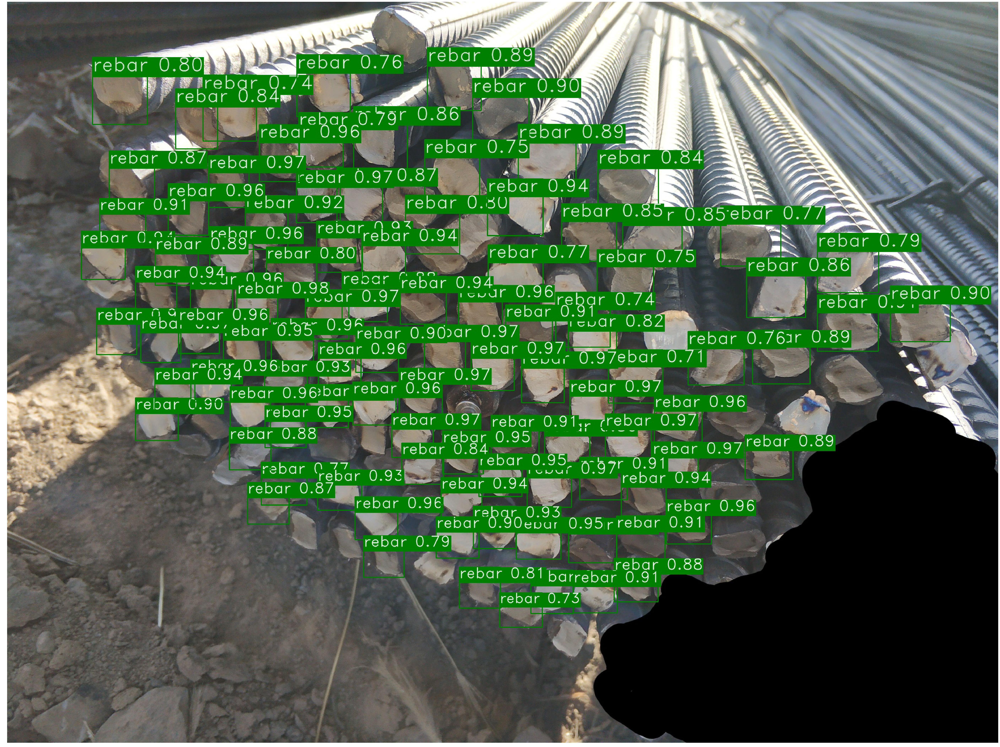

In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg 
%matplotlib inline
# 预测结果展示
img = mpimg.imread("output/visualize_FAC06BA2.jpg")
plt.figure(figsize=(100,100))
plt.imshow(img) 
plt.axis('off') 
plt.show()

# 5.DL可视化
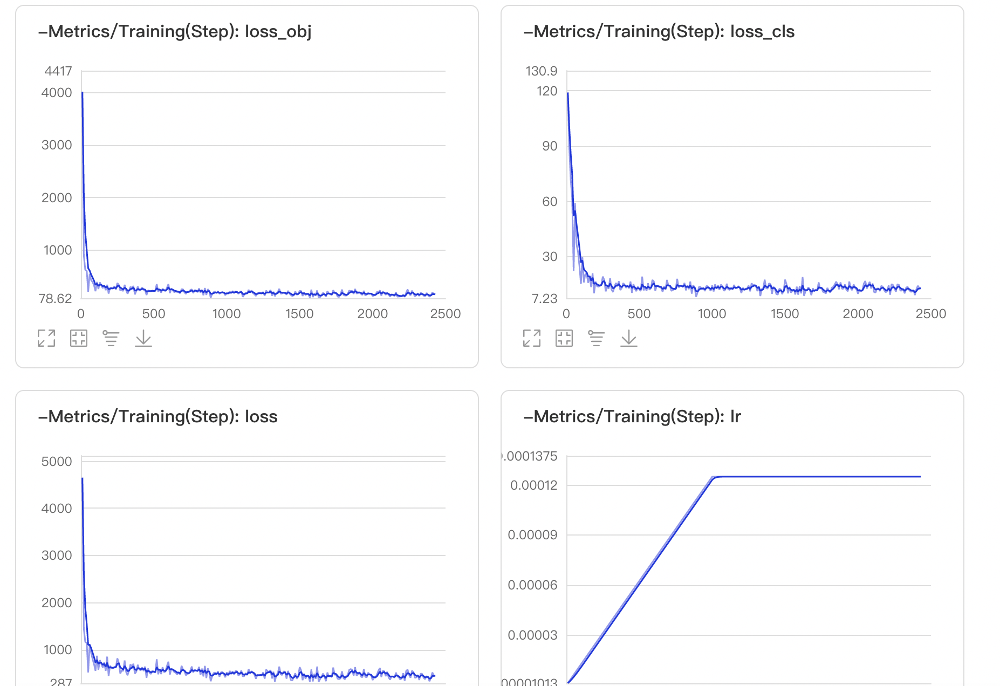
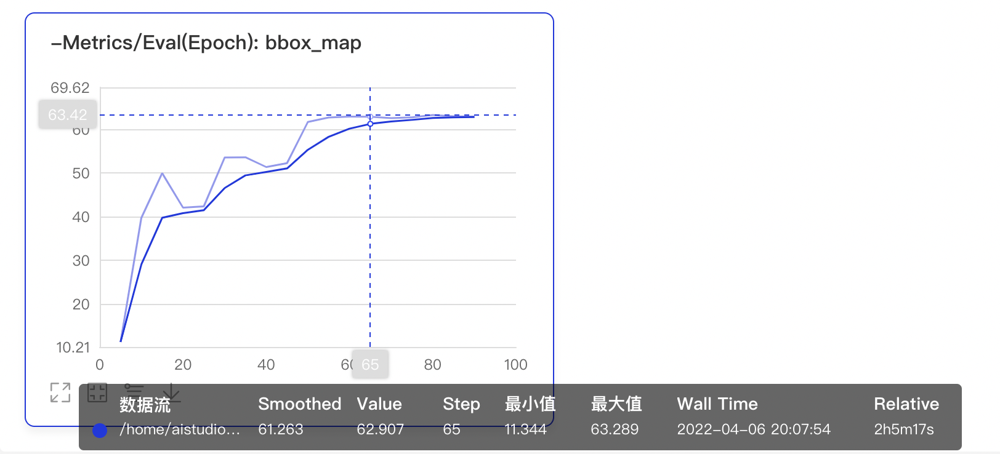